In [1]:
# Four tools useful for handling phase-field simulation (Fig.4)

In [2]:
import os
import requests
import csv
import matplotlib.pyplot as plt
import numpy as np
from langchain_ollama import ChatOllama
from langchain_core.tools import tool
from langchain.agents import create_agent
from langchain_core.messages import AIMessage


In [3]:
#Numerical parameter values
PI = 3.141592 #π
RR = 8.3145 #Gas constant [J／（mol K）]

#Setting materials and process constants
ND = 128  #Dividing number in the difference method

#c0 = 0.5 #Alloy composition （moll fraction of Cr）
al = 100.0*1.e-9 #Side length of 2-dimensional simulation area [m]
b1 = al/ND #1 block size in the difference method [m]

#These are not a real time but an increment
itime1 = 0 #Initial time ）
itime1max = 10000 + 1 #Time to stop the simulation
itime1_step = 1000 #Time step to save the field data

#Fluctuation factor
c_flu_ini=0.01 #Fluctuation factor in initial field
c_flu=0.0 #Fluctuation factor in dcdt

#Output folder
output_folder = "Phase_decomp_RSA_out/"
os.makedirs(output_folder, exist_ok=True)


In [4]:
# Definition of tool
@tool
# Definition of tool
def Check_phase_field_simulation_RSA(aging_temp1: float, alloy_comp1: float, time_step1: float)-> int:
    """
    This is a check version of the simulation.
    Performs a phase-field simulation of phase decomposition in A-B binary alloy with regular solution approximation during isothermal aging.
    It receives three input parameters: aging temperature with the unit K, alloy composition with atomic fraction B component,
    and dimensionless time step. 
    The phase-field simulation is performed, and the calculation results (simulated field images) are displied on screen. 
    Finally, it returns the end status of the calculation as an int type. When the value of the end status is 0, the calculation fails, 
    and when the value of the end status is 1, the calculation succeeds.

    Args:
        temp1 (float): temperature, a float type input parameter, unit is K.
        comp1 (float): alloy composition, a float type input parameter, atomic fraction of B component.
        time_step1 (float): time step, a float type input parameter, dimensionless value.

    Returns:
        iflg (int): end status of the calculation.
    """
    
    temp=aging_temp1  
    c0=alloy_comp1 
    delt=time_step1 

    Rtemp = RR*temp # ＲＴ [J/mol]
 
    iflg=0    

    L0=25000.0/Rtemp #Interaction parameter [J/mol]
    kappa = 5.0e-15/b1** 2/Rtemp #Composition gradient energy coefficient, Normalized to b1 and RT[Jm^2/mol]/b1^2/RT]
    Mc=c0*(1.0-c0) #Mobility of atomic diffusion (dimensionless)

    #Simulation of spinodal decomposition
    c2 = c0 + c_flu_ini*(2.0*np.random.rand(ND, ND)-1.0)  #Initial field setting

    for itime1 in range(itime1max):  #loop
        c1 =1.0 - c2
        time1=delt*itime1 #time（dimensionless）

        mu_chem=L0*(c1-c2)+np.log(c2)-np.log(c1) #chemical potential difference
        mu_grad=-2.0*kappa*(np.roll(c2,1,0) + np.roll(c2,-1,0) + np.roll(c2,1,1) + np.roll(c2,-1,1) - 4.0*c2) #Concentration gradient potential
        mu = mu_chem+mu_grad
        mu_dev = np.roll(mu,1,0) + np.roll(mu,-1,0) + np.roll(mu,1,1) + np.roll(mu,-1,1) - 4.0*mu

        dcdt = Mc*mu_dev  #Nonlinear diffusion equation
        c2n = c2 + ( dcdt+ c_flu*(2.0*np.random.rand(ND)-1.0) )*delt  #Explicit-difference method
        res = c2n - (np.mean(c2n) - c0)  #Correction for average composition
        c2 = np.clip(res, 1.0e-06, 1.0-1.0e-06)  #Correction of composition range

        #Drawing field data
        if(itime1 % itime1_step) == 0:
            print('time =', time1)
            plt.clf() #clear drawing area
            plt.axis("off")
            plt.imshow(c2)  #Drawing composition field
            plt.clim(0, 1)  #Maximum and minimum color scale settings
            plt.pause(1.0)  #displayed for 1.0 sec
            #------------------------
            iflg=1
            
    return iflg

In [5]:
# Definition of tool
@tool
def Save_phase_field_simulation_RSA(index: int, aging_temp1: float, alloy_comp1: float, time_step1: float)-> int:
    """
    This is a save version of the simulation.
    Performs a phase-field simulation of phase decomposition in A-B binary alloy with regular solution approximation during isothermal aging.
    It receives four input parameters: file_index, aging temperature with the unit K, alloy composition with atomic fraction B component,
    and dimensionless time step. 
    The phase-field simulation is performed, and the calculation results (numerical information of the composition field) is saved on hard-disk drive. 
    Finally, it returns the end status of the calculation as an int type. When the value of the end status is 0, the calculation fails, 
    and when the value of the end status is 1, the calculation succeeds.

    Args:
        index (int): file index, an integer type input parameter.
        temp1 (float): temperature, a float type input parameter, unit is K.
        comp1 (float): alloy composition, a float type input parameter, atomic fraction of B component.
        time_step1 (float): time step, a float type input parameter, dimensionless value.

    Returns:
        iflg (int): end status of the calculation.
    """
    
    np.random.seed(index)

    temp=aging_temp1  
    c0=alloy_comp1 
    delt=time_step1 #delt = 0.2 #time increment [dimensionless]

    Rtemp = RR*temp # ＲＴ [J/mol]

    text_temp = str(temp)
    text_comp = str(c0)
    text_delt = str(delt)
    text_index = str(index)
    
    filename0 = f"PF_T{text_temp}_c{text_comp}_dt{text_delt}_No{text_index}"
    filename = f"{filename0}.csv"
    path = "./"+output_folder+filename

    iflg=0    

    L0=25000.0/Rtemp #Interaction parameter [J/mol]
    kappa = 5.0e-15/b1** 2/Rtemp #Composition gradient energy coefficient, Normalized to b1 and RT[Jm^2/mol]/b1^2/RT]
    Mc=c0*(1.0-c0) #Mobility of atomic diffusion (dimensionless)

    #Simulation of spinodal decomposition
    c2 = c0 + c_flu_ini*(2.0*np.random.rand(ND, ND)-1.0)  #Initial field setting

    for itime1 in range(itime1max):  #loop
        c1 =1.0 - c2
        time1=delt*itime1 #time（dimensionless）

        mu_chem=L0*(c1-c2)+np.log(c2)-np.log(c1) #chemical potential difference
        mu_grad=-2.0*kappa*(np.roll(c2,1,0) + np.roll(c2,-1,0) + np.roll(c2,1,1) + np.roll(c2,-1,1) - 4.0*c2) #Concentration gradient potential
        mu = mu_chem+mu_grad
        mu_dev = np.roll(mu,1,0) + np.roll(mu,-1,0) + np.roll(mu,1,1) + np.roll(mu,-1,1) - 4.0*mu

        dcdt = Mc*mu_dev  #Nonlinear diffusion equation
        c2n = c2 + ( dcdt+ c_flu*(2.0*np.random.rand(ND)-1.0) )*delt  #Explicit-difference method
        res = c2n - (np.mean(c2n) - c0)  #Correction for average composition
        c2 = np.clip(res, 1.0e-06, 1.0-1.0e-06)  #Correction of composition range

        #Save composition field
        if(itime1 % itime1_step) == 0:
            file = open(path, "a", newline='')
            writer0 = csv.writer(file, delimiter=',')
            writer0.writerow([time1])
            writer0.writerows(c2)
            file.close() #save_data(time1, c2)
            #------------------------
            iflg=1 #The field data is saved

    return iflg

In [6]:
# Definition of tool
@tool
def Load_data_display_images(Fname: str)-> int:
    """
    This is the image display version of simulated data.
    It receives the file name with string type, then load the simulated data from the hard disk drive and display images.
    Finally, it returns the end status of the imaging process as an int type. When the value of the end status is 0, the process fails, 
    and when the value of the end status is 1, the process succeeds.

    Args:
        Fname (str): file name, a str type input parameter.

    Returns:
        iflg (int): end status of the process.
    """
    
    iflg=0    
    rows = []

    filename = f"{Fname}.csv"
    path = "./"+output_folder+filename
    file = open(path, "r")
    reader0 = csv.reader(file, delimiter=',')
   
    i=0
    for row in reader0:
        rows.append(row);  i+=1
    Ndata=int(i/(ND+1))

    time0 = []
    cc = np.zeros((Ndata, ND, ND))
    for ii in range (Ndata):
        iii=ii*(ND+1)
        time0.append(float(rows[iii][0]))
        for i in range (ND):
            for j in range (ND):
                cc[ii][i][j] = (float(rows[iii+i+1][j]))

    for i in range (Ndata):
        time1 = time0[i]
        c = cc[i,:,:]

        print('time =', time1)
        plt.clf() # 描画内容クリア
        plt.imshow(c)  # 濃度場の描画
        plt.axis('off') 
        plt.clim(0, 1)  # カラースケールの最大、最小の設定
        plt.pause(1.0)  # 1.0秒間表示             
        iflg=1

    return iflg

In [7]:
# Definition of tool
@tool
def Load_data_save_images(Fname: str)-> int:
    """
    This is the image saving version of simulated data.
    It receives the file name with string type, then load the simulated data from the hard disk drive and save each image as an image file.
    Finally, it returns the end status of the imaging process as an int type. When the value of the end status is 0, the process fails, 
    and when the value of the end status is 1, the process succeeds.

    Args:
        Fname (str): file name, a str type input parameter.

    Returns:
        iflg (int): end status of the process.
    """
    
    iflg=0    
    rows = []

    filename = f"{Fname}.csv"
    path = "./"+output_folder+filename
    file = open(path, "r")
    reader0 = csv.reader(file, delimiter=',')
   
    i=0
    for row in reader0:
        rows.append(row);  i+=1
    Ndata=int(i/(ND+1))

    time0 = []
    cc = np.zeros((Ndata, ND, ND))
    for ii in range (Ndata):
        iii=ii*(ND+1)
        time0.append(float(rows[iii][0]))
        for i in range (ND):
            for j in range (ND):
                cc[ii][i][j] = (float(rows[iii+i+1][j]))

    for i in range (Ndata):
        time1 = time0[i]
        c = cc[i,:,:]

        print('time =', time1)
        plt.clf() # 描画内容クリア
        plt.imshow(c)  # 濃度場の描画
        plt.axis('off') 
        plt.clim(0, 1)  # カラースケールの最大、最小の設定

        fname="./"+output_folder+"image"+Fname+"_"+str(time1).replace(".", "")+".jpg"
        plt.savefig(fname, bbox_inches='tight', pad_inches=0.0)
        plt.pause(1.0)  # 1.0秒間表示     
        iflg=1

    return iflg

In [8]:
tools = [Check_phase_field_simulation_RSA, Save_phase_field_simulation_RSA, Load_data_display_images, Load_data_save_images]
LLM = "qwen3:8b"
model = ChatOllama( 
    model=LLM, 
    temperature=0 
)
agent = create_agent( 
    model=model, 
    tools=tools 
)


time = 0.0


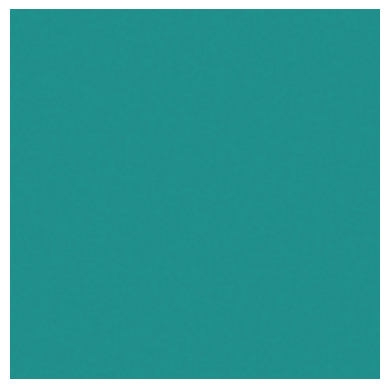

time = 20.0


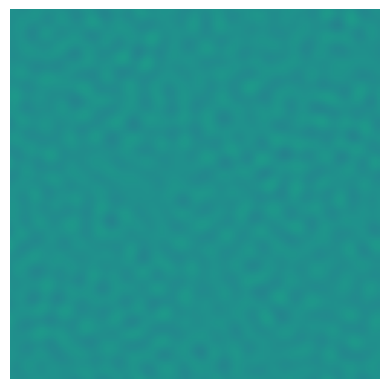

time = 40.0


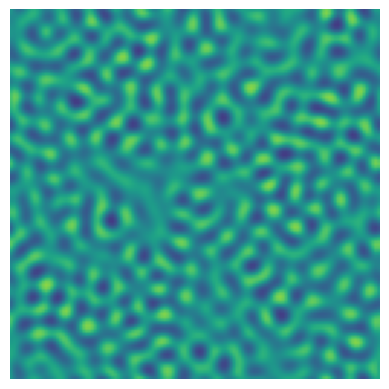

time = 60.0


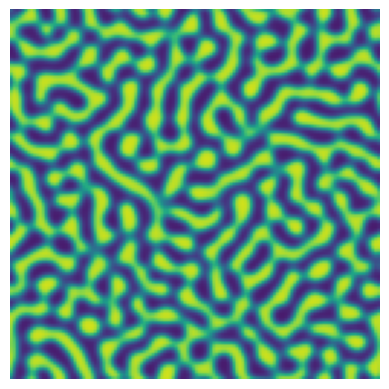

time = 80.0


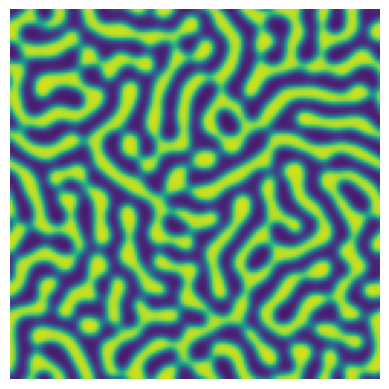

time = 100.0


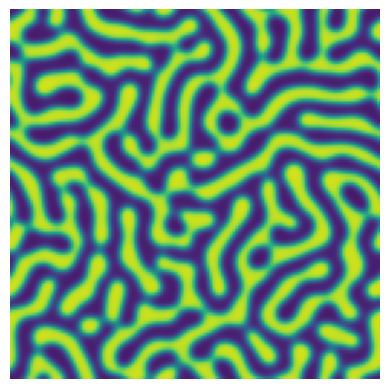

time = 120.0


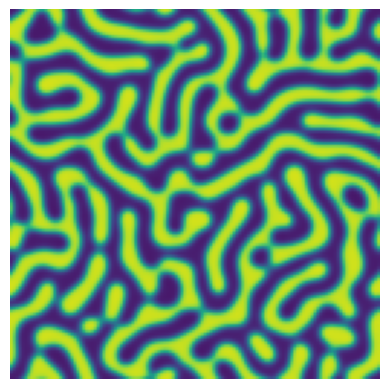

time = 140.0


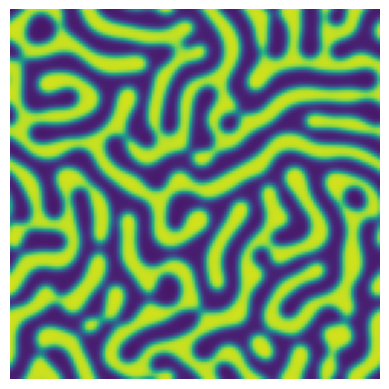

time = 160.0


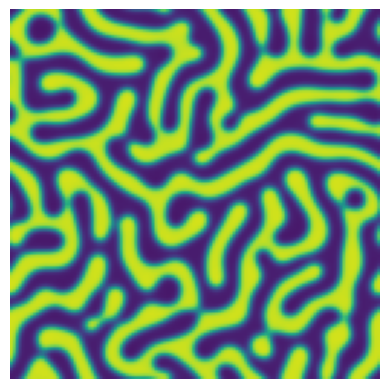

time = 180.0


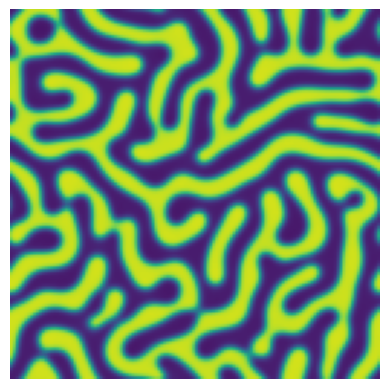

time = 200.0


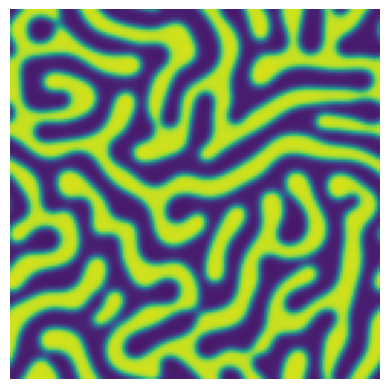


- 
- <think>
Okay, the user wants to run the Check_phase_field_simulation_RSA tool with fixed parameters: aging temperature at 1000 K, alloy composition 0.5, and time step 0.02. I called the function with those arguments and got a response of 1. The response indicates the calculation succeeded. Now, I need to inform the user that the simulation completed successfully. Since the user mentioned running the tool, they might be checking if the setup is correct or if the simulation can proceed. The next step might be to save the results or visualize them, but since the user only asked to run the check, I should confirm the success and maybe ask if they need further steps. I should keep the response clear and concise, mentioning the parameters used and the success status.
</think>

The phase-field simulation using the `Check_phase_field_simulation_RSA` tool has been completed successfully under the specified conditions:
- **Aging Temperature**: 1000 K  
- **Alloy Composition**: 0.5 (atomic 

In [9]:
# Run the agent
messages = {
    "messages": [{"role": "user", "content": """Fix the aging temperature at 1000 K, fix the alloy composition to 0.5, and fix the time step to 0.02. 
               Under the above conditions, run the tool:'Check_phase_field_simulation_RSA'."""}]
}
answer = agent.invoke(messages)
messages_list = answer["messages"] # Get the messages list
filtered_messages = [msg.content for msg in messages_list if isinstance(msg, AIMessage)] # Extract assistant messages only.
formatted_output = "\n- " + "\n- ".join(filtered_messages) # Formatted and output
print(formatted_output)


In [10]:
# Run the agent
messages = {
    "messages": [{"role": "user", "content": """Fix the aging temperature at 1000 K, fix the alloy composition to 0.5, and fix the time step to 0.02. 
               Under the above conditions, changing the index number ranging from 1 to 50 in increments of 1, 
               run the tool: 'Save_phase_field_simulation_RSA' separately for each index number."""}]
}
answer = agent.invoke(messages)
messages_list = answer["messages"] # Get the messages list
filtered_messages = [msg.content for msg in messages_list if isinstance(msg, AIMessage)] # Extract assistant messages only.
formatted_output = "\n- " + "\n- ".join(filtered_messages) # Formatted and output
print(formatted_output)



- 
- <think>
Okay, the user wants me to process the response from the tool calls. They fixed the aging temperature at 1000 K, alloy composition at 0.5, and time step at 0.02. Then they ran the Save_phase_field_simulation_RSA for indexes 1 to 50. The tool responses all came back as 1, which means each simulation was successful.

Now, I need to confirm that all 50 simulations completed without errors. Since each call returned 1, I can inform the user that all runs were successful. Maybe they want to proceed to the next step, like loading the data or displaying images. I should offer to help with that. Let me check the available functions again. There's Load_data_display_images and Load_data_save_images. The user might want to visualize the results or save the images. I'll ask if they need assistance with either of those next steps. That way, I'm providing a clear path forward based on the successful completion of the simulations.
</think>

All 50 phase-field simulations were successfull

time = 0.0


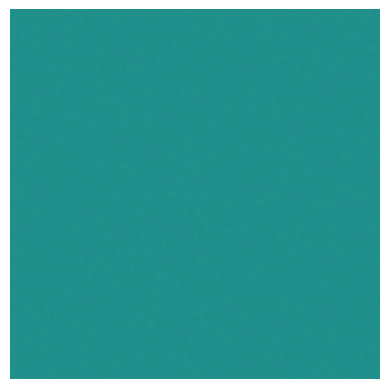

time = 20.0


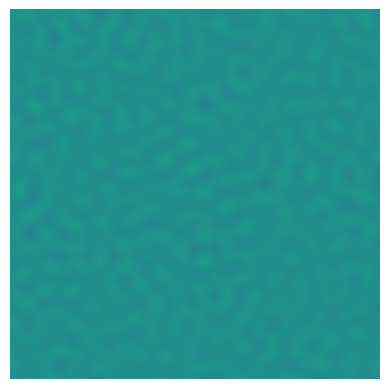

time = 40.0


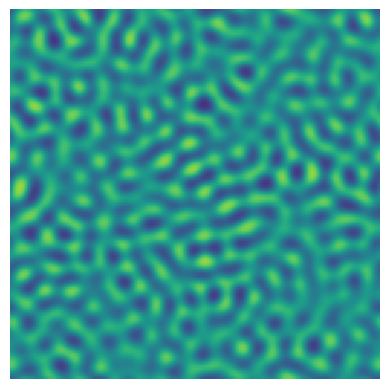

time = 60.0


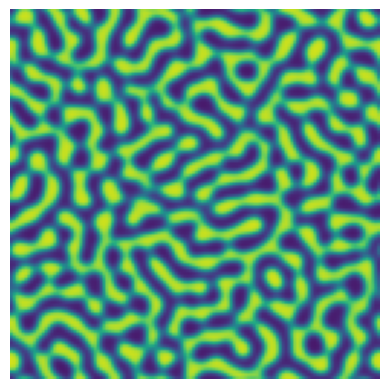

time = 80.0


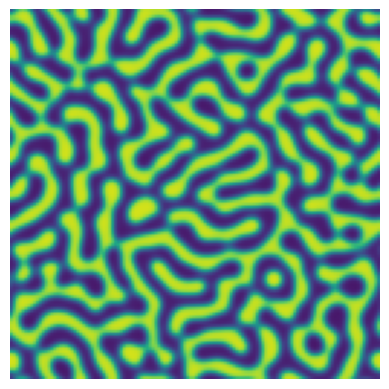

time = 100.0


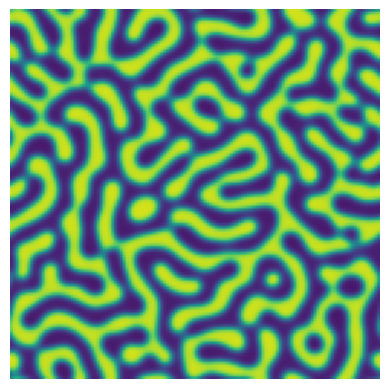

time = 120.0


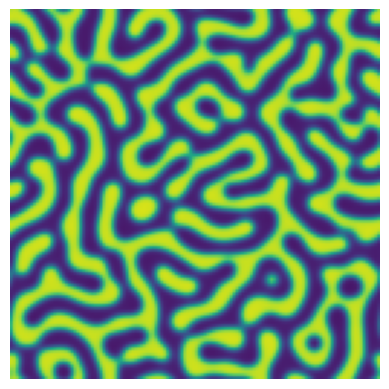

time = 140.0


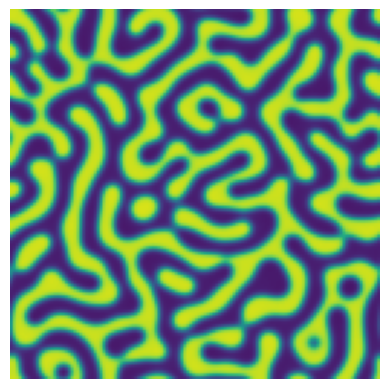

time = 160.0


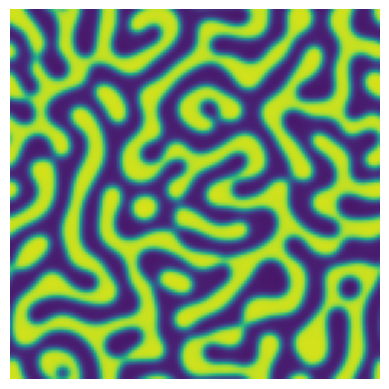

time = 180.0


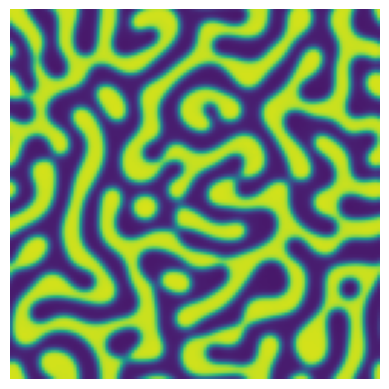

time = 200.0


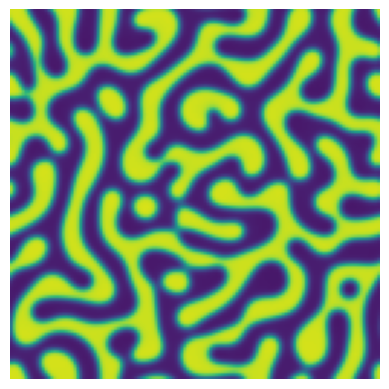


- 
- <think>
Okay, the user provided a file name "PF_T1000.0_c0.5_dt0.02_No50" and wants to display the image data using the Load_data_display_images tool. I need to check if the function call was successful. The response from the tool was 1, which indicates success. Now, I should confirm that the images were displayed correctly. Since the tool returns 1, the process worked. I should inform the user that the image display was successful and maybe ask if they need further assistance. Let me make sure the message is clear and concise.
</think>

The image data from the file "PF_T1000.0_c0.5_dt0.02_No50" has been successfully displayed. The process completed without errors (return code: 1). 

Would you like to perform any other operations, such as saving the images or analyzing the simulation results?


In [11]:
# Run the agent
messages = {
    "messages": [{"role": "user", "content": """The file name is "PF_T1000.0_c0.5_dt0.02_No50". 
                Display the image data by using the tool:'Load_data_display_images'."""}]
}
answer = agent.invoke(messages)
messages_list = answer["messages"] # Get the messages list
filtered_messages = [msg.content for msg in messages_list if isinstance(msg, AIMessage)] # Extract assistant messages only.
formatted_output = "\n- " + "\n- ".join(filtered_messages) # Formatted and output
print(formatted_output)


In [12]:
# Run the agent
messages = {
    "messages": [{"role": "user", "content": """Fix the index number to 1, fix the aging temperature at 1000 K, and fix the time step to 0.02. 
               Under the above conditions, repeat the tool: 'Save_phase_field_simulation_RSA' by changing the alloy composition 
               from 0.35 to 0.45 in increments of 0.05."""}]
}
answer = agent.invoke(messages)
messages_list = answer["messages"] # Get the messages list
filtered_messages = [msg.content for msg in messages_list if isinstance(msg, AIMessage)] # Extract assistant messages only.
formatted_output = "\n- " + "\n- ".join(filtered_messages) # Formatted and output
print(formatted_output)



- 
- <think>
Okay, the user wants me to fix the index at 1, aging temperature at 1000 K, and time step at 0.02. Then, they want to run the Save_phase_field_simulation_RSA tool with alloy compositions from 0.35 to 0.45 in increments of 0.05. 

First, I need to check the parameters for each function call. The Save_phase_field_simulation_RSA requires index, aging_temp1, alloy_comp1, and time_step1. The user specified index 1, temp 1000 K, time step 0.02, and alloy comp increments of 0.05. So the compositions should be 0.35, 0.4, 0.45.

I need to make sure each function call has the correct parameters. Let me structure each call with the fixed parameters and the varying alloy composition. The previous assistant's response had three tool calls, each with the correct parameters. The tool responses were all 1, indicating success. 

Now, the user might expect confirmation that all simulations were successful. I should inform them that each composition was processed without errors. Also, maybe

time = 0.0


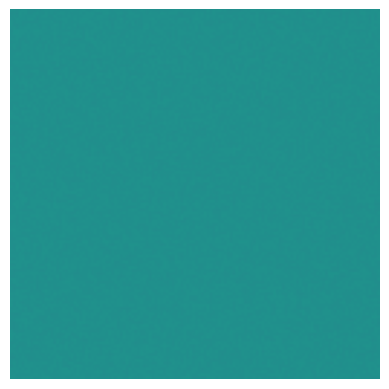

time = 20.0


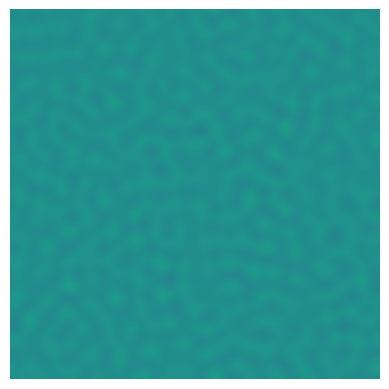

time = 40.0


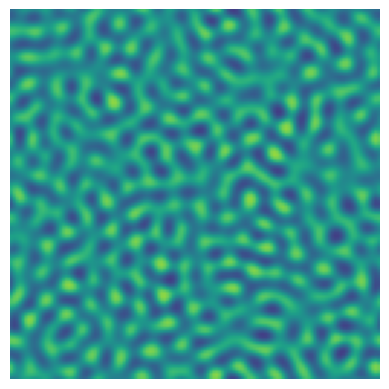

time = 60.0


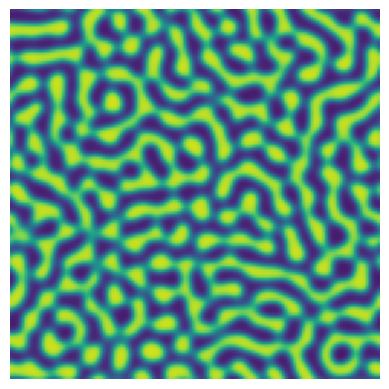

time = 80.0


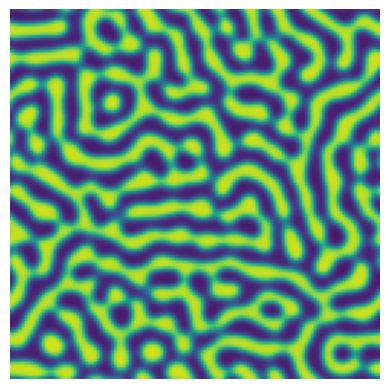

time = 100.0


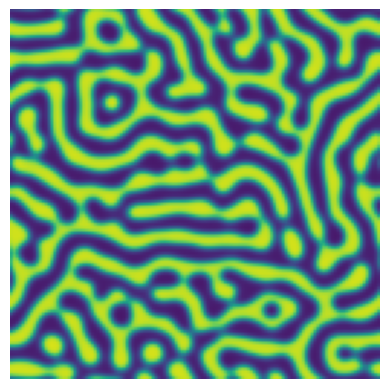

time = 120.0


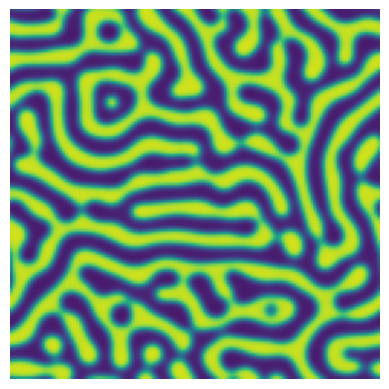

time = 140.0


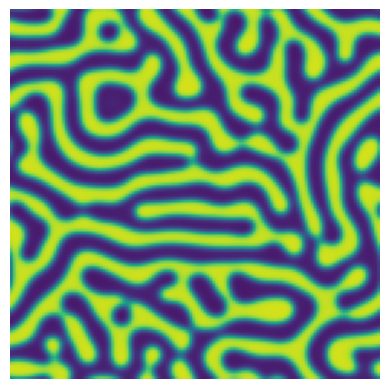

time = 160.0


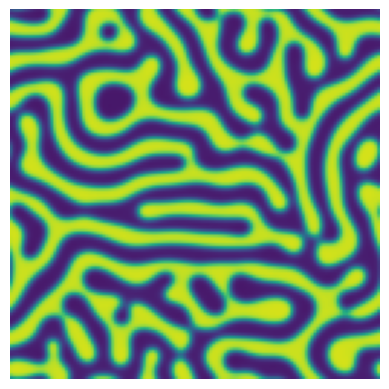

time = 180.0


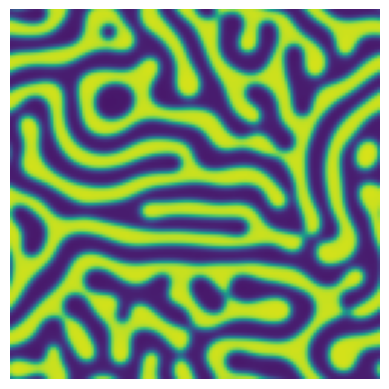

time = 200.0


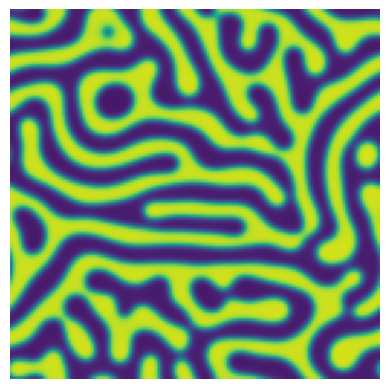

time = 0.0


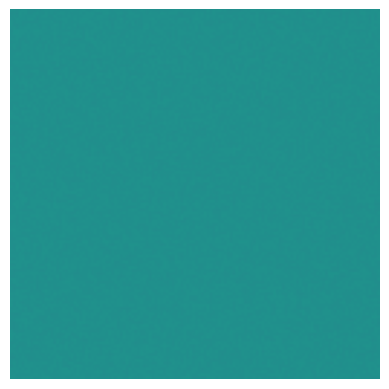

time = 20.0


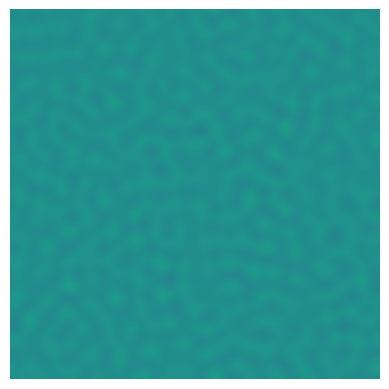

time = 40.0


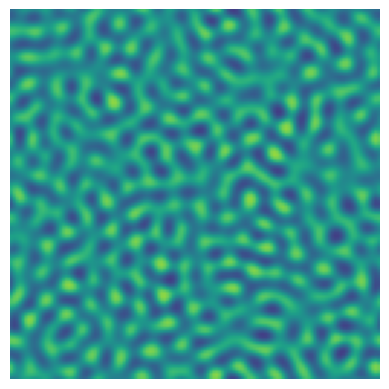

time = 60.0


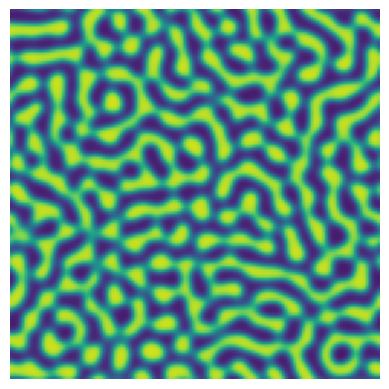

time = 80.0


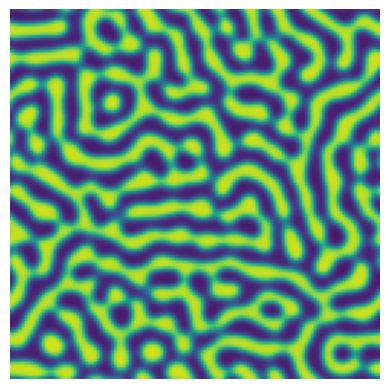

time = 100.0


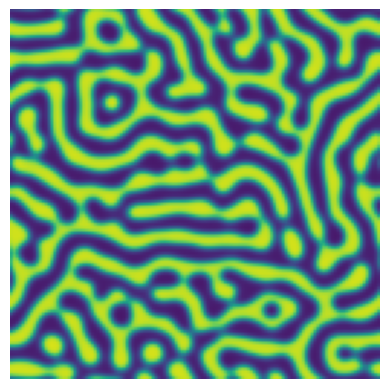

time = 120.0


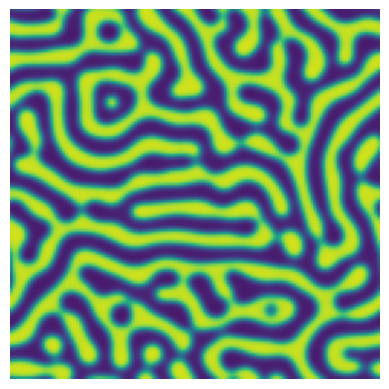

time = 140.0


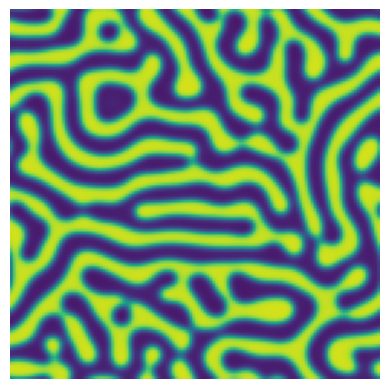

time = 160.0


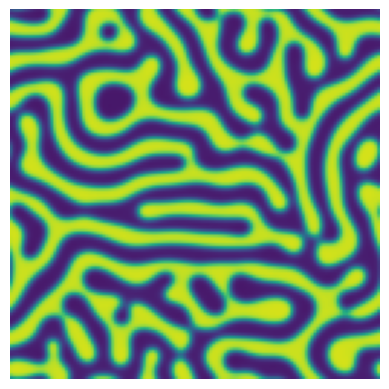

time = 180.0


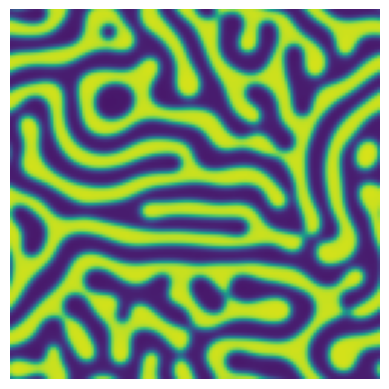

time = 200.0


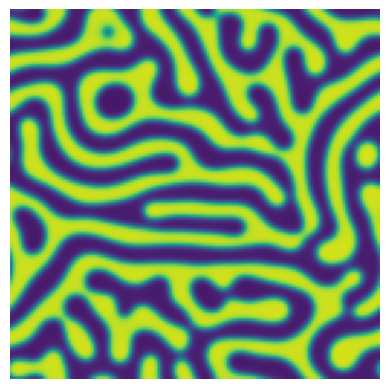


- 
- <think>
Okay, the user provided a file name "PF_T1000.0_c0.5_dt0.02_No3" and wants to save the image data using the Load_data_save_images tool. Let me check the functions available.

The Load_data_save_images function takes a file name as a string argument. The user already provided the file name, so I just need to pass it correctly. The parameters require "Fname" as a string. The previous tool call used this function with the given file name, and the response was 1, which indicates success. Now, the user probably expects confirmation that the images were saved successfully. I should inform them that the process completed without errors and maybe ask if they need further assistance. Let me make sure the response is clear and concise.
</think>

The image data has been successfully saved using the file name "PF_T1000.0_c0.5_dt0.02_No3". The process completed without errors (return status: 1). 

Would you like to perform any other operations with this data?


In [13]:
# Run the agent
messages = {
    "messages": [{"role": "user", "content": """The file name is "PF_T1000.0_c0.5_dt0.02_No3". 
                Save the image data by using the tool:'Load_data_save_images'."""}]
}
answer = agent.invoke(messages)
messages_list = answer["messages"] # Get the messages list
filtered_messages = [msg.content for msg in messages_list if isinstance(msg, AIMessage)] # Extract assistant messages only.
formatted_output = "\n- " + "\n- ".join(filtered_messages) # Formatted and output
print(formatted_output)
